In [6]:
import torch
import torch.nn as nn

class UNet(nn.Module):
    def __init__(self, in_channels=1, out_channels=1):
        super(UNet, self).__init__()

        def conv_block(in_ch, out_ch):
            return nn.Sequential(
                nn.Conv2d(in_ch, out_ch, 3, padding=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_ch, out_ch, 3, padding=1),
                nn.ReLU(inplace=True)
            )

        self.down1 = conv_block(in_channels, 64)
        self.pool1 = nn.MaxPool2d(2)

        self.down2 = conv_block(64, 128)
        self.pool2 = nn.MaxPool2d(2)

        self.down3 = conv_block(128, 256)
        self.pool3 = nn.MaxPool2d(2)

        self.down4 = conv_block(256, 512)
        self.pool4 = nn.MaxPool2d(2)

        self.bottleneck = conv_block(512, 1024)

        self.up4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.dec4 = conv_block(1024, 512)

        self.up3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = conv_block(512, 256)

        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = conv_block(256, 128)

        self.up1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = conv_block(128, 64)

        self.final = nn.Conv2d(64, out_channels, kernel_size=1)

    def forward(self, x):
        d1 = self.down1(x)
        p1 = self.pool1(d1)

        d2 = self.down2(p1)
        p2 = self.pool2(d2)

        d3 = self.down3(p2)
        p3 = self.pool3(d3)

        d4 = self.down4(p3)
        p4 = self.pool4(d4)

        bn = self.bottleneck(p4)

        up4 = self.up4(bn)
        merge4 = torch.cat([up4, d4], dim=1)
        dec4 = self.dec4(merge4)

        up3 = self.up3(dec4)
        merge3 = torch.cat([up3, d3], dim=1)
        dec3 = self.dec3(merge3)

        up2 = self.up2(dec3)
        merge2 = torch.cat([up2, d2], dim=1)
        dec2 = self.dec2(merge2)

        up1 = self.up1(dec2)
        merge1 = torch.cat([up1, d1], dim=1)
        dec1 = self.dec1(merge1)

        return torch.sigmoid(self.final(dec1))


In [7]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = UNet().to(device)
model.load_state_dict(torch.load("unet_dagm_class1.pth", map_location=device))
model.eval()

print("✅ Model weights loaded.")


✅ Model weights loaded.


In [20]:
from PIL import Image
import numpy as np
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Test edilecek görüntü yolu
test_img_path = "../static/DAGM_KaggleUpload/Class1/Test/0002.PNG"

# Görüntüyü yükle, gri tonlamaya çevir ve yeniden boyutlandır
img = Image.open(test_img_path).convert("L").resize((256, 256))

# Numpy dizisine çevir ve normalize et
img_np = np.array(img, dtype=np.float32) / 255.0

# Torch tensöre çevir ve modele uygun boyuta getir: [1, 1, 256, 256]
img_tensor = torch.tensor(img_np).unsqueeze(0).unsqueeze(0).to(device)


In [33]:
with torch.no_grad():
    pred_mask = model(img_tensor)[0].cpu().squeeze().numpy()

pred_binary = (pred_mask > 0.03).astype(float)

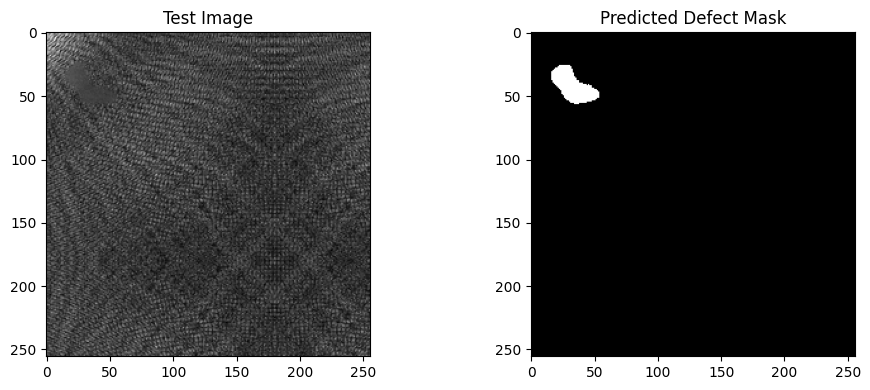

In [34]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.imshow(img_np, cmap="gray")
plt.title("Test Image")

plt.subplot(1, 2, 2)
plt.imshow(pred_binary, cmap="gray")
plt.title("Predicted Defect Mask")

plt.tight_layout()
plt.show()


Model loaded successfully on: cuda
Number of test images: 575
Average IoU: 0.4481
Average Pixel Accuracy: 0.9911


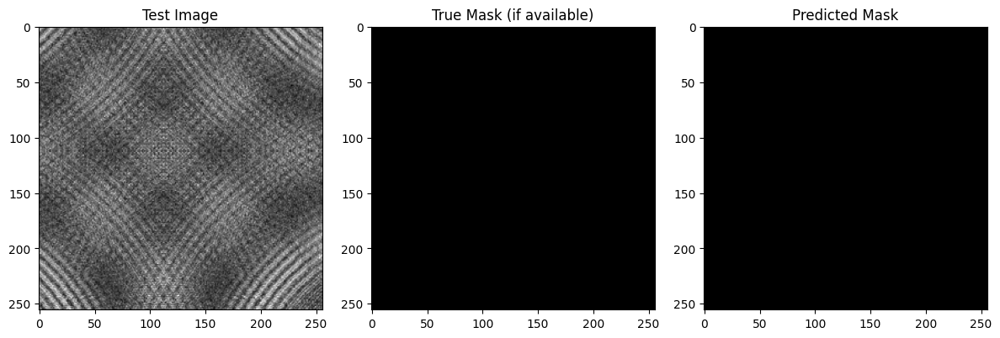

In [35]:
import os
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from PIL import Image

#############################################
# 1) REBUILD YOUR U-NET ARCHITECTURE
#############################################
class UNet(nn.Module):
    def __init__(self, in_channels=1, out_channels=1):
        super(UNet, self).__init__()

        def conv_block(in_ch, out_ch):
            return nn.Sequential(
                nn.Conv2d(in_ch, out_ch, 3, padding=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_ch, out_ch, 3, padding=1),
                nn.ReLU(inplace=True),
            )

        self.down1 = conv_block(in_channels, 64)
        self.pool1 = nn.MaxPool2d(2)
        self.down2 = conv_block(64, 128)
        self.pool2 = nn.MaxPool2d(2)
        self.down3 = conv_block(128, 256)
        self.pool3 = nn.MaxPool2d(2)
        self.down4 = conv_block(256, 512)
        self.pool4 = nn.MaxPool2d(2)

        self.bottleneck = conv_block(512, 1024)

        self.up4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.dec4 = conv_block(1024, 512)

        self.up3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = conv_block(512, 256)

        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = conv_block(256, 128)

        self.up1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = conv_block(128, 64)

        self.final = nn.Conv2d(64, out_channels, kernel_size=1)

    def forward(self, x):
        d1 = self.down1(x)
        p1 = self.pool1(d1)

        d2 = self.down2(p1)
        p2 = self.pool2(d2)

        d3 = self.down3(p2)
        p3 = self.pool3(d3)

        d4 = self.down4(p3)
        p4 = self.pool4(d4)

        bn = self.bottleneck(p4)

        up4 = self.up4(bn)
        merge4 = torch.cat([up4, d4], dim=1)
        dec4 = self.dec4(merge4)

        up3 = self.up3(dec4)
        merge3 = torch.cat([up3, d3], dim=1)
        dec3 = self.dec3(merge3)

        up2 = self.up2(dec3)
        merge2 = torch.cat([up2, d2], dim=1)
        dec2 = self.dec2(merge2)

        up1 = self.up1(dec2)
        merge1 = torch.cat([up1, d1], dim=1)
        dec1 = self.dec1(merge1)

        return torch.sigmoid(self.final(dec1))

#############################################
# 2) LOAD TRAINED MODEL WEIGHTS
#############################################
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet().to(device)
model.load_state_dict(torch.load("unet_dagm_class1.pth", map_location=device))
model.eval()
print("Model loaded successfully on:", device)

#############################################
# 3) SET UP TEST FOLDER & LABEL FOLDER
#############################################
test_dir = "../static/DAGM_KaggleUpload/Class1/Test"
label_dir = "../static/DAGM_KaggleUpload/Class1/Test/Label"

#############################################
# 4) OPTIONAL: FUNCTIONS FOR METRICS
#############################################
def compute_iou(pred, mask):
    """Computes the Intersection over Union for two binary masks."""
    intersection = (pred * mask).sum()
    union = (pred + mask).sum() - intersection
    if union == 0:
        return 1.0  # if both are empty
    else:
        return intersection / union

def compute_pixel_accuracy(pred, mask):
    """Pixel-level accuracy: fraction of correct (same) pixels."""
    return (pred == mask).sum() / pred.size

#############################################
# 5) TEST ALL IMAGES IN THE TEST FOLDER
#############################################
all_iou = []
all_acc = []

# Collect all .PNG files in test directory
test_images = [f for f in sorted(os.listdir(test_dir)) if f.endswith(".PNG")]

for img_file in test_images:
    img_path = os.path.join(test_dir, img_file)

    # Parse label file name (e.g. "0002_label.PNG")
    base_name = os.path.splitext(img_file)[0]       # "0002"
    label_file = f"{base_name}_label.PNG"
    label_path = os.path.join(label_dir, label_file)

    # ---- Load & Preprocess the Test Image ----
    img_pil = Image.open(img_path).convert("L").resize((256, 256))
    img_np = np.array(img_pil, dtype=np.float32) / 255.0
    img_tensor = torch.tensor(img_np).unsqueeze(0).unsqueeze(0).to(device)

    # ---- Run Model Prediction ----
    with torch.no_grad():
        pred_mask = model(img_tensor)[0].cpu().squeeze().numpy()

    # Threshold the predicted mask
    pred_binary = (pred_mask > 0.03).astype(float)

    # ---- Load or Construct the Ground Truth Mask ----
    if os.path.exists(label_path):
        mask_pil = Image.open(label_path).convert("L").resize((256, 256))
        true_mask = (np.array(mask_pil, dtype=np.uint8) > 127).astype(float)
    else:
        # If no label file, treat as "no defect"
        true_mask = np.zeros_like(pred_binary)

    # ---- Compute Metrics (IoU & Pixel Accuracy) ----
    iou_score = compute_iou(pred_binary, true_mask)
    acc_score = compute_pixel_accuracy(pred_binary, true_mask)

    all_iou.append(iou_score)
    all_acc.append(acc_score)

    # (Optional) Print per-image results
    # print(f"{img_file} => IoU: {iou_score:.4f}, Acc: {acc_score:.4f}")

#############################################
# 6) PRINT OVERALL TEST STATISTICS
#############################################
mean_iou = np.mean(all_iou) if all_iou else 0
mean_acc = np.mean(all_acc) if all_acc else 0

print(f"Number of test images: {len(test_images)}")
print(f"Average IoU: {mean_iou:.4f}")
print(f"Average Pixel Accuracy: {mean_acc:.4f}")

#############################################
# 7) OPTIONAL: VISUALIZE SOME PREDICTIONS
#############################################
# Let's visualize the last processed image
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.imshow(img_np, cmap='gray')
plt.title("Test Image")

plt.subplot(1, 3, 2)
plt.imshow(true_mask, cmap='gray')
plt.title("True Mask (if available)")

plt.subplot(1, 3, 3)
plt.imshow(pred_binary, cmap='gray')
plt.title("Predicted Mask")

plt.tight_layout()
plt.show()


Found 575 test images.


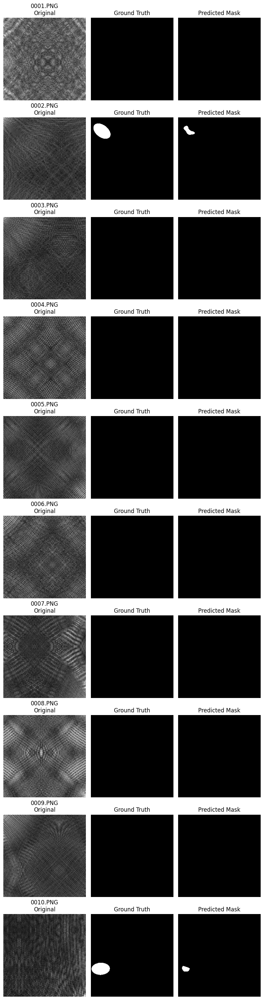

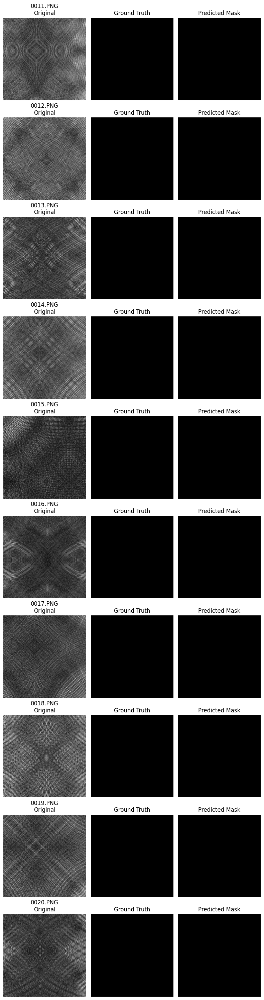

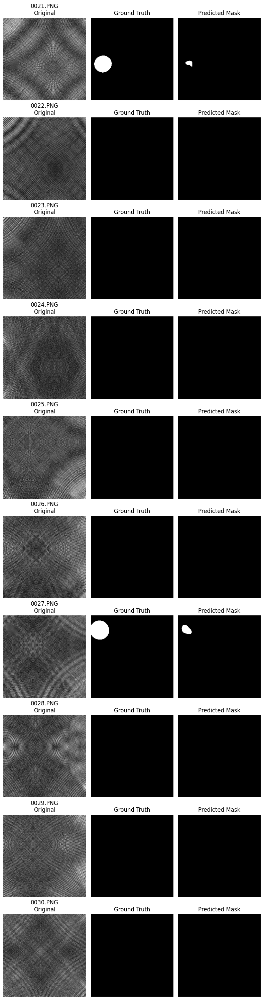

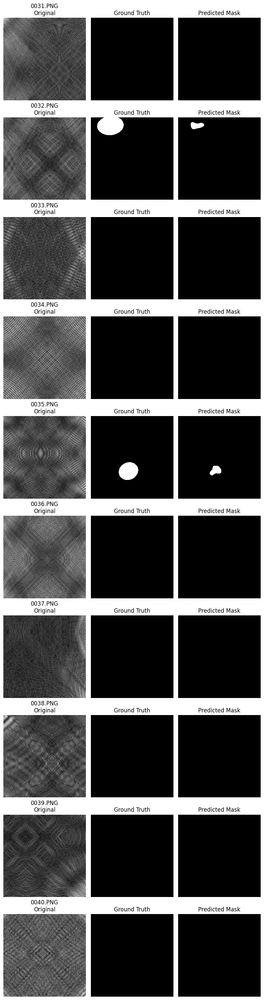

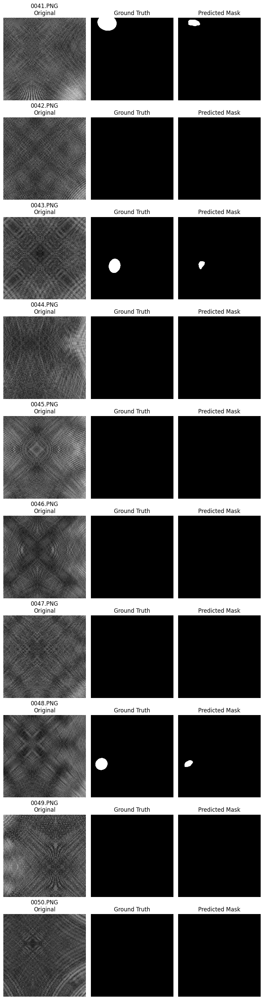

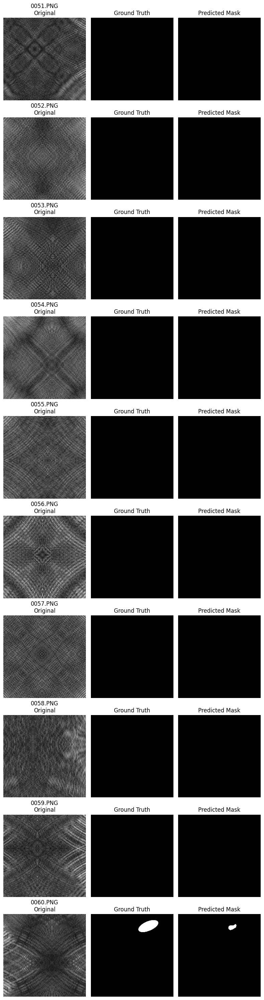

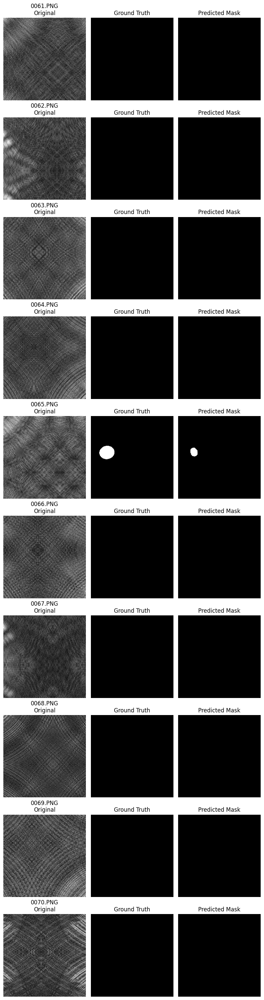

In [2]:
import os
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from PIL import Image

#############################################
# 1) U-NET MODEL DEFINITION
#############################################
class UNet(nn.Module):
    def __init__(self, in_channels=1, out_channels=1):
        super(UNet, self).__init__()

        def conv_block(in_ch, out_ch):
            return nn.Sequential(
                nn.Conv2d(in_ch, out_ch, 3, padding=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_ch, out_ch, 3, padding=1),
                nn.ReLU(inplace=True),
            )

        self.down1 = conv_block(in_channels, 64)
        self.pool1 = nn.MaxPool2d(2)
        self.down2 = conv_block(64, 128)
        self.pool2 = nn.MaxPool2d(2)
        self.down3 = conv_block(128, 256)
        self.pool3 = nn.MaxPool2d(2)
        self.down4 = conv_block(256, 512)
        self.pool4 = nn.MaxPool2d(2)

        self.bottleneck = conv_block(512, 1024)

        self.up4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.dec4 = conv_block(1024, 512)
        self.up3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = conv_block(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = conv_block(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = conv_block(128, 64)

        self.final = nn.Conv2d(64, out_channels, kernel_size=1)

    def forward(self, x):
        d1 = self.down1(x)
        p1 = self.pool1(d1)

        d2 = self.down2(p1)
        p2 = self.pool2(d2)

        d3 = self.down3(p2)
        p3 = self.pool3(d3)

        d4 = self.down4(p3)
        p4 = self.pool4(d4)

        bn = self.bottleneck(p4)

        up4 = self.up4(bn)
        merge4 = torch.cat([up4, d4], dim=1)
        dec4 = self.dec4(merge4)

        up3 = self.up3(dec4)
        merge3 = torch.cat([up3, d3], dim=1)
        dec3 = self.dec3(merge3)

        up2 = self.up2(dec3)
        merge2 = torch.cat([up2, d2], dim=1)
        dec2 = self.dec2(merge2)

        up1 = self.up1(dec2)
        merge1 = torch.cat([up1, d1], dim=1)
        dec1 = self.dec1(merge1)

        return torch.sigmoid(self.final(dec1))


#############################################
# 2) LOAD MODEL WEIGHTS
#############################################
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet().to(device)
model.load_state_dict(torch.load("unet_dagm_class1.pth", map_location=device))
model.eval()

#############################################
# 3) TEST FOLDERS & FILE LIST
#############################################
test_dir = "../static/DAGM_KaggleUpload/Class1/Test"
label_dir = "../static/DAGM_KaggleUpload/Class1/Test/Label"

test_images = [f for f in sorted(os.listdir(test_dir)) if f.endswith(".PNG")]
n = len(test_images)
print(f"Found {n} test images.")

#############################################
# 4) SPLIT INTO MULTIPLE FIGURES
#############################################
# Adjust 'batch_size' to control how many images per figure
batch_size = 10

for start_idx in range(0, n, batch_size):
    end_idx = min(start_idx + batch_size, n)
    current_batch = test_images[start_idx:end_idx]

    # We'll create a new figure for each batch
    fig = plt.figure(figsize=(8, 3*len(current_batch)))

    for i, img_file in enumerate(current_batch):
        img_path = os.path.join(test_dir, img_file)

        base_name = os.path.splitext(img_file)[0]
        label_file = f"{base_name}_label.PNG"
        label_path = os.path.join(label_dir, label_file)

        # --- Load & Preprocess Test Image ---
        img_pil = Image.open(img_path).convert("L").resize((256, 256))
        img_np = np.array(img_pil, dtype=np.float32) / 255.0
        img_tensor = torch.tensor(img_np).unsqueeze(0).unsqueeze(0).to(device)

        # --- Predict ---
        with torch.no_grad():
            pred_mask = model(img_tensor)[0].cpu().squeeze().numpy()
        pred_binary = (pred_mask > 0.05).astype(float)

        # --- Load Ground Truth if exist, else zero ---
        if os.path.exists(label_path):
            mask_pil = Image.open(label_path).convert("L").resize((256, 256))
            true_mask = (np.array(mask_pil, dtype=np.uint8) > 127).astype(float)
        else:
            true_mask = np.zeros_like(pred_binary)

        # --- Subplots: Original, Ground Truth, Prediction ---
        # Original image
        plt.subplot(len(current_batch), 3, i*3 + 1)
        plt.imshow(img_np, cmap='gray')
        plt.title(f"{img_file}\nOriginal")
        plt.axis('off')

        # Ground Truth Mask
        plt.subplot(len(current_batch), 3, i*3 + 2)
        plt.imshow(true_mask, cmap='gray')
        plt.title("Ground Truth")
        plt.axis('off')

        # Predicted Mask
        plt.subplot(len(current_batch), 3, i*3 + 3)
        plt.imshow(pred_binary, cmap='gray')
        plt.title("Predicted Mask")
        plt.axis('off')

    plt.tight_layout()
    plt.show()
